# Image Transforms

In [7]:
# load image
from torchvision.io import read_image
import matplotlib.pyplot as plt
from torchvision.transforms import (
    Resize, RandomCrop, CenterCrop, RandomHorizontalFlip,
    RandomRotation, ColorJitter, Normalize, Compose, Grayscale, RandomPerspective, RandomAutocontrast, RandomEqualize, Lambda, GaussianBlur
)
from torchvision.transforms import functional

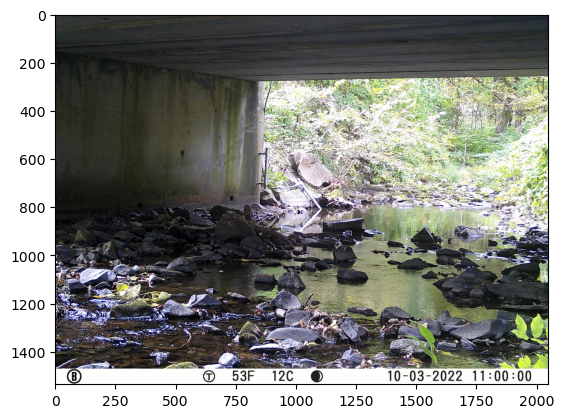

In [89]:
image_path = '/home/jeff/data/fpe/images/imagesets/b94e847f-43c3-43cd-973a-14f0c5af29ad/images/West Brook Master__2022-10-03__11-00-00(1).JPG'
image = read_image(image_path)
image = image / 255.0  # convert to float in [0,1]

# show image
plt.imshow(image.permute(1, 2, 0))
plt.show()

In [91]:
crop_ratio = 0.8
input_size = 480
image_shape = image.shape
aspect = image.shape[2] / image.shape[1]
resize_shape = [input_size, int(input_size * aspect)]
input_shape = [
    int(input_size * crop_ratio), 
    int(input_size * crop_ratio * aspect)
]
print(f"Image shape: {image_shape}")
print(f"Aspect ratio = width / height: {aspect}")
print(f"Resize shape = [input_size, input_size * aspect]: {resize_shape}")
print(f"Input shape = Resize * Crop ratio: {input_shape}")

Image shape: torch.Size([3, 1536, 2048])
Aspect ratio = width / height: 1.3333333333333333
Resize shape = [input_size, input_size * aspect]: [480, 640]
Input shape = Resize * Crop ratio: [384, 512]


In [92]:
image

tensor([[[0.1725, 0.1765, 0.1804,  ..., 0.1529, 0.1529, 0.1490],
         [0.1843, 0.1843, 0.1843,  ..., 0.1490, 0.1451, 0.1451],
         [0.1961, 0.1961, 0.1961,  ..., 0.1451, 0.1490, 0.1490],
         ...,
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961]],

        [[0.1725, 0.1765, 0.1804,  ..., 0.1765, 0.1725, 0.1686],
         [0.1843, 0.1843, 0.1843,  ..., 0.1725, 0.1686, 0.1686],
         [0.1961, 0.1961, 0.1961,  ..., 0.1686, 0.1725, 0.1725],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.1647, 0.1686, 0.1725,  ..., 0.1608, 0.1569, 0.1529],
         [0.1765, 0.1765, 0.1765,  ..., 0.1647, 0.1529, 0.1529],
         [0.1882, 0.1882, 0.1882,  ..., 0.1608, 0.1569, 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00024650953..1.0000002].


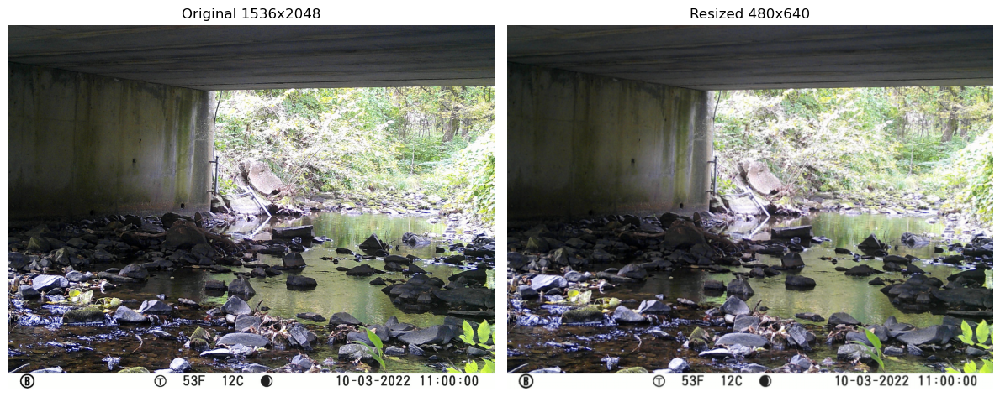

In [94]:
# resize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Original image
ax1.imshow(image.permute(1, 2, 0))
ax1.set_title(f'Original {image.shape[1]}x{image.shape[2]}')
ax1.axis('off')

# Resized image 
resized_image = Resize(resize_shape)(image)
ax2.imshow(resized_image.permute(1, 2, 0))
ax2.set_title(f'Resized {resized_image.shape[1]}x{resized_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00024650953..1.0000002].


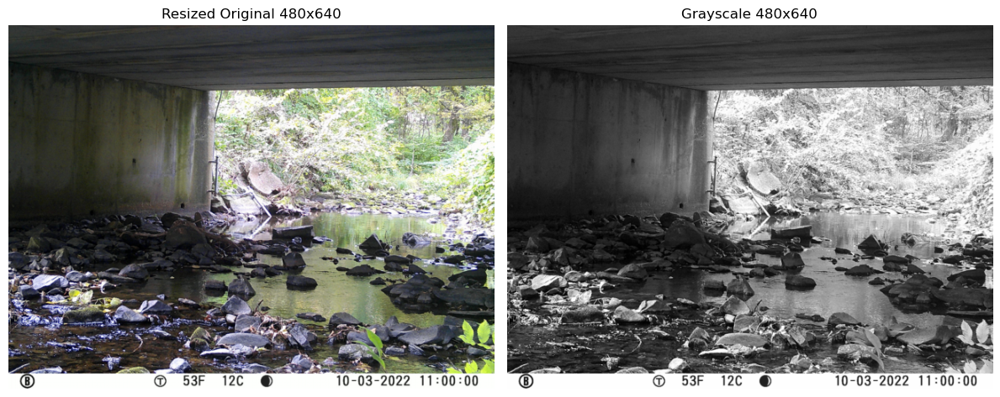

In [96]:
# grayscale
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Resized image
ax1.imshow(resized_image.permute(1, 2, 0))
ax1.set_title(f'Resized Original {resized_image.shape[1]}x{resized_image.shape[2]}')
ax1.axis('off')

gray_image = Grayscale(num_output_channels=3)(resized_image)
ax2.imshow(gray_image.permute(1, 2, 0))
ax2.set_title(f'Grayscale {gray_image.shape[1]}x{gray_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00024650953..1.0000002].


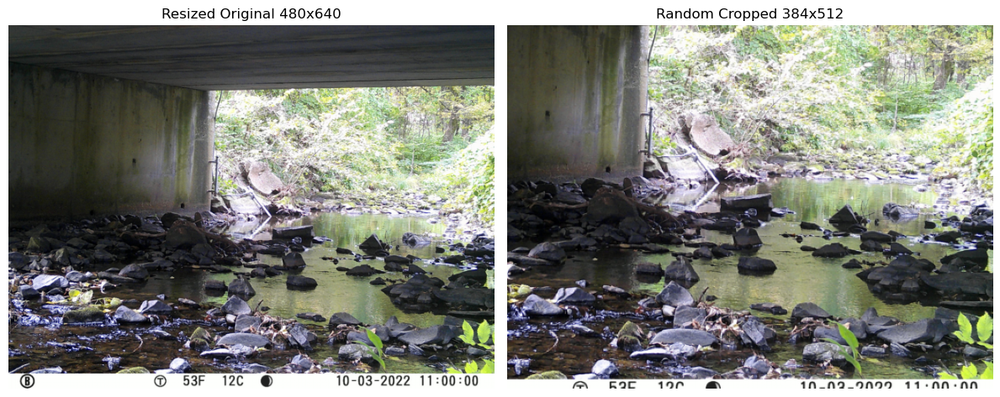

In [97]:
# random crop
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Resized image
ax1.imshow(resized_image.permute(1, 2, 0))
ax1.set_title(f'Resized Original {resized_image.shape[1]}x{resized_image.shape[2]}')
ax1.axis('off')

random_cropped_image = RandomCrop(input_shape)(resized_image)
ax2.imshow(random_cropped_image.permute(1, 2, 0))
ax2.set_title(f'Random Cropped {random_cropped_image.shape[1]}x{random_cropped_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00024650953..1.0000002].


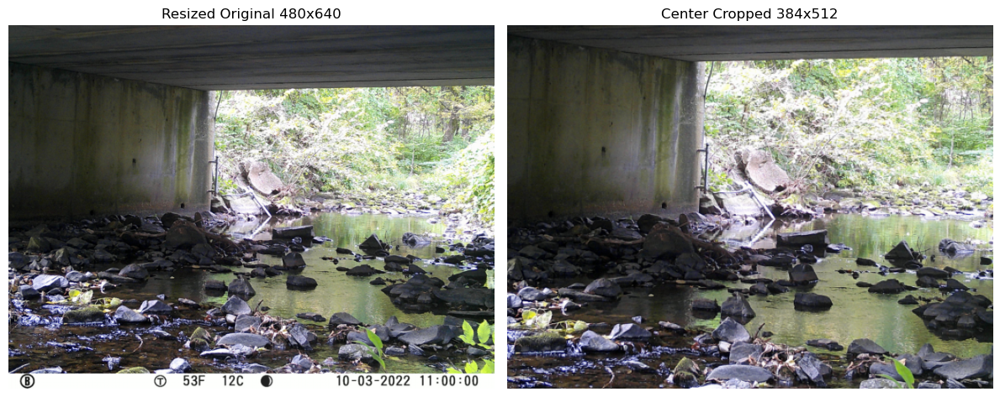

In [98]:
# center crop
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Resized image
ax1.imshow(resized_image.permute(1, 2, 0))
ax1.set_title(f'Resized Original {resized_image.shape[1]}x{resized_image.shape[2]}')
ax1.axis('off')

center_cropped_image = CenterCrop(input_shape)(resized_image)
ax2.imshow(center_cropped_image.permute(1, 2, 0))
ax2.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

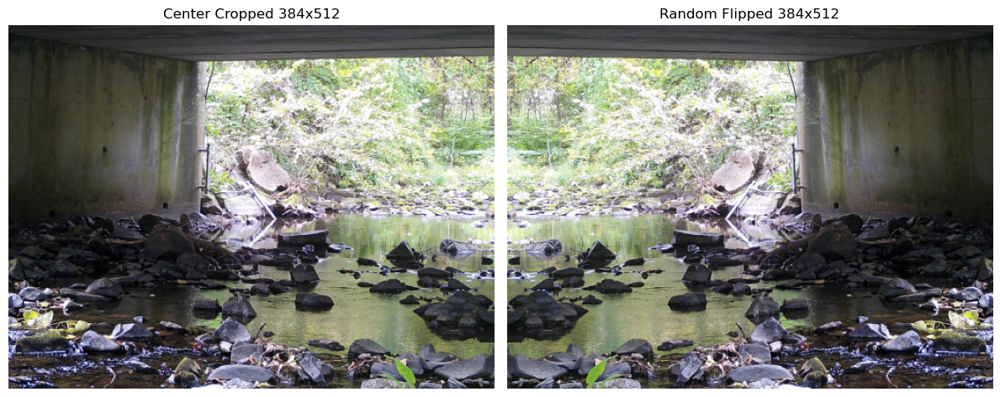

In [99]:
# random horizontal flip
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

random_flipped_image = RandomHorizontalFlip(1)(center_cropped_image)
ax2.imshow(random_flipped_image.permute(1, 2, 0))
ax2.set_title(f'Random Flipped {random_flipped_image.shape[1]}x{random_flipped_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

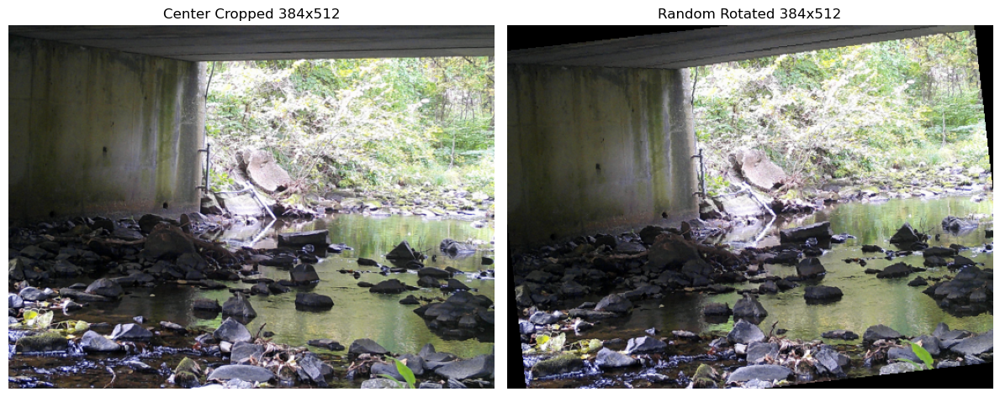

In [100]:
# random rotation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

random_rotated_image = RandomRotation(degrees=(-10, 10))(center_cropped_image)
ax2.imshow(random_rotated_image.permute(1, 2, 0))
ax2.set_title(f'Random Rotated {random_rotated_image.shape[1]}x{random_rotated_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

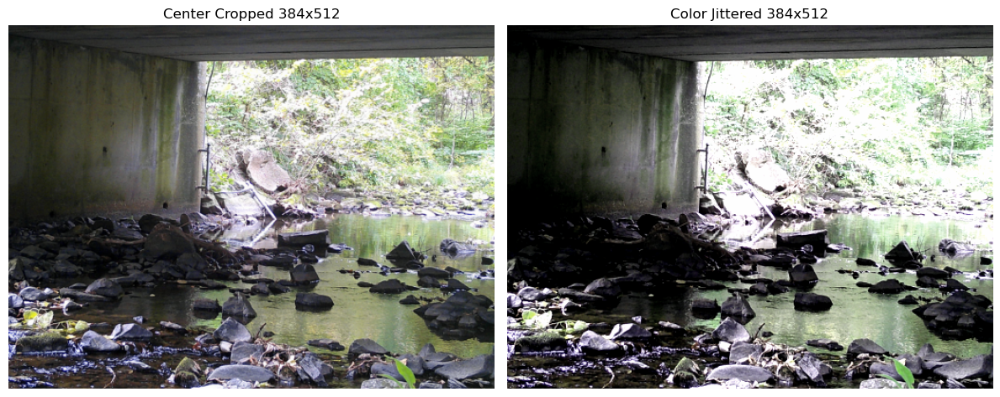

In [101]:
# color jitter
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

color_jitted_image = ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1)(center_cropped_image)
ax2.imshow(color_jitted_image.permute(1, 2, 0))
ax2.set_title(f'Color Jittered {color_jitted_image.shape[1]}x{color_jitted_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4975854..2.2573824].


Normalized image mean: tensor([0.0654, 0.0621, 0.0895])
Min values per channel: tensor([-1.4796, -1.4976, -1.3831])
Max values per channel: tensor([2.1038, 2.0731, 2.2574])


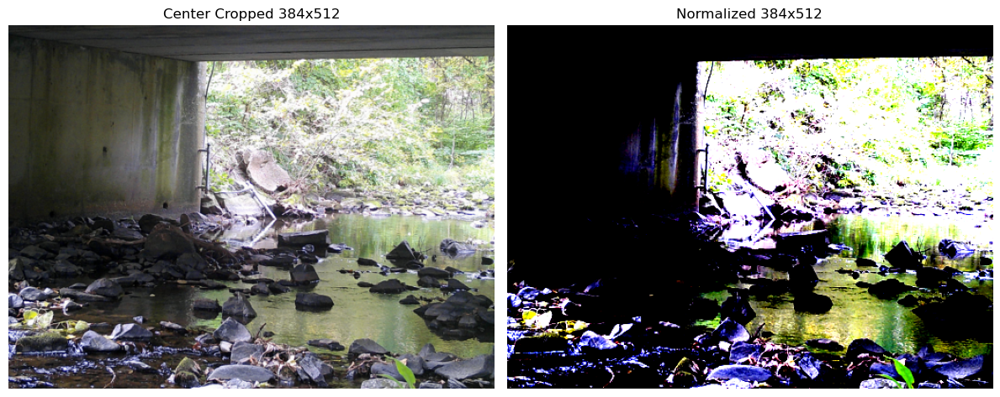

In [103]:
# normalize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

normalized_image = Normalize([0.41198368, 0.41920773, 0.38000175], [0.27820219, 0.27957918, 0.27361202])(center_cropped_image.float())
ax2.imshow(normalized_image.permute(1, 2, 0))
ax2.set_title(f'Normalized {normalized_image.shape[1]}x{normalized_image.shape[2]}')
ax2.axis('off')

# print mean and range of each channel
print(f"Normalized image mean: {normalized_image.mean(dim=(1, 2))}")
min_per_channel = normalized_image.min(dim=1)[0].min(dim=1)[0]
max_per_channel = normalized_image.max(dim=1)[0].max(dim=1)[0]
print(f"Min values per channel: {min_per_channel}")
print(f"Max values per channel: {max_per_channel}")

plt.tight_layout()
plt.show()

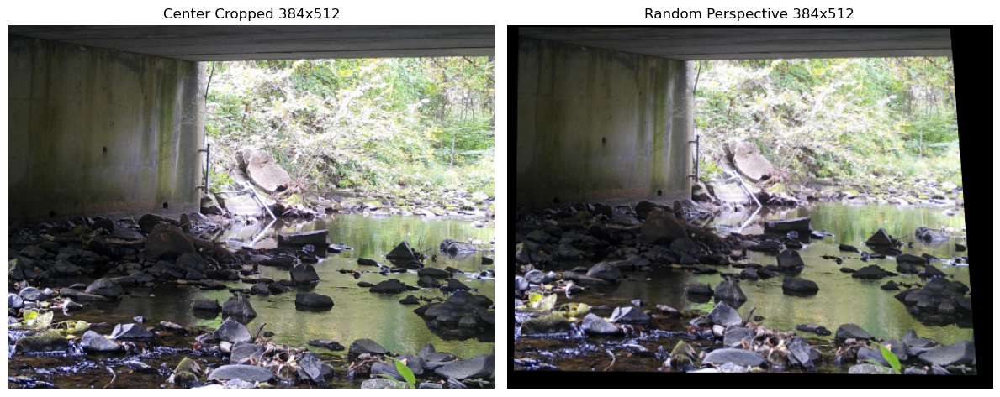

In [105]:
# random perspective
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

random_perspective_image = RandomPerspective(distortion_scale=0.2)(center_cropped_image)
ax2.imshow(random_perspective_image.permute(1, 2, 0))
ax2.set_title(f'Random Perspective {random_perspective_image.shape[1]}x{random_perspective_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

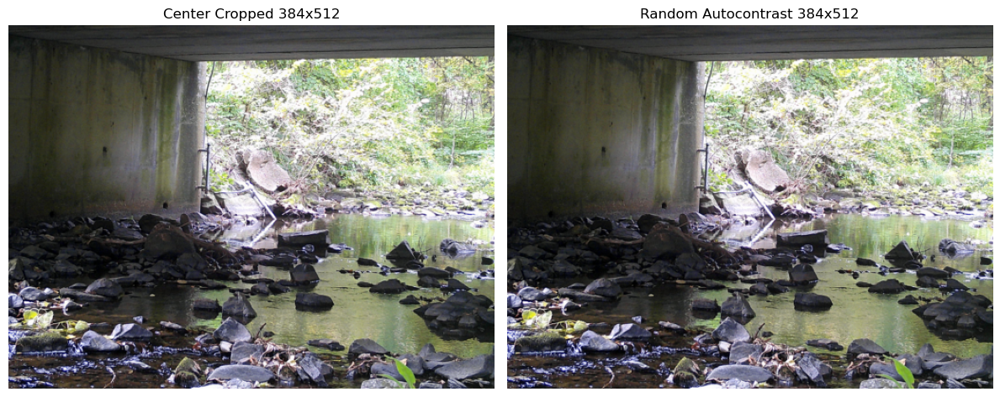

In [106]:
# random autocontrast
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

random_autocontrast_image = RandomAutocontrast(0.5)(center_cropped_image)
ax2.imshow(random_autocontrast_image.permute(1, 2, 0))
ax2.set_title(f'Random Autocontrast {random_autocontrast_image.shape[1]}x{random_autocontrast_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

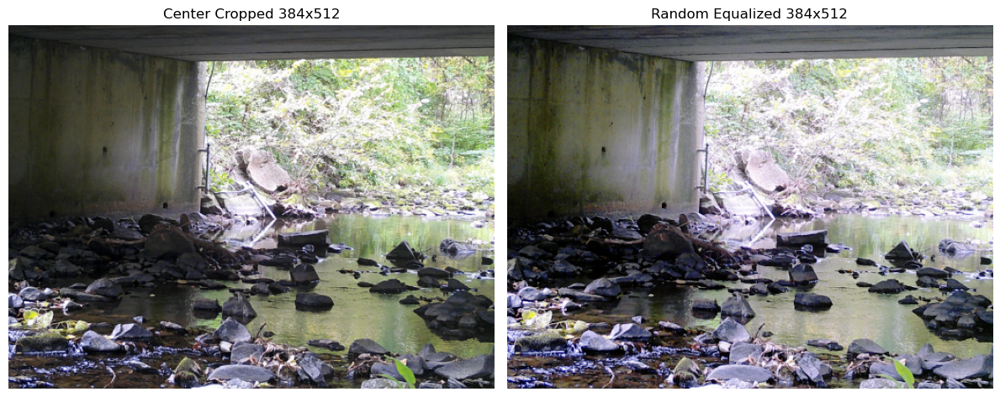

In [112]:
# random equalize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

import torch

random_equalized_image = RandomEqualize(1)((center_cropped_image * 255.0).to(torch.uint8))
ax2.imshow(random_equalized_image.permute(1, 2, 0))
ax2.set_title(f'Random Equalized {random_equalized_image.shape[1]}x{random_equalized_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

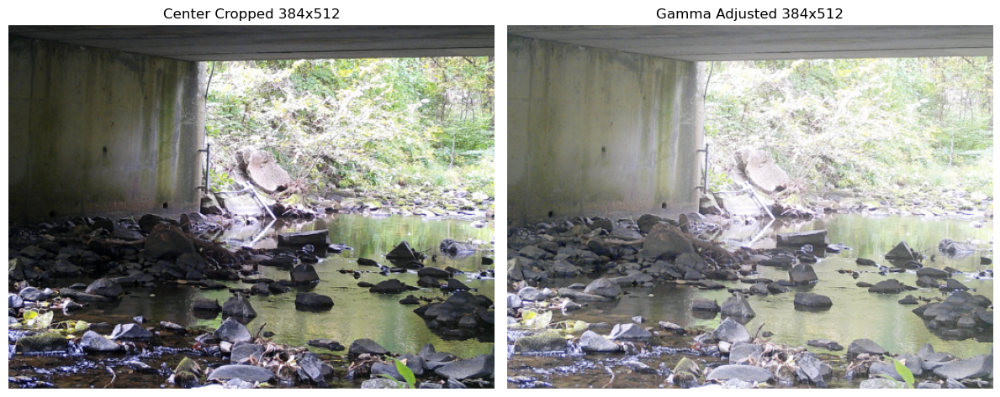

In [113]:
# gamma
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off') 

gamma_adjusted_image = Lambda(lambda img: functional.adjust_gamma(img, gamma=0.5))(center_cropped_image)
ax2.imshow(gamma_adjusted_image.permute(1, 2, 0))
ax2.set_title(f'Gamma Adjusted {gamma_adjusted_image.shape[1]}x{gamma_adjusted_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()

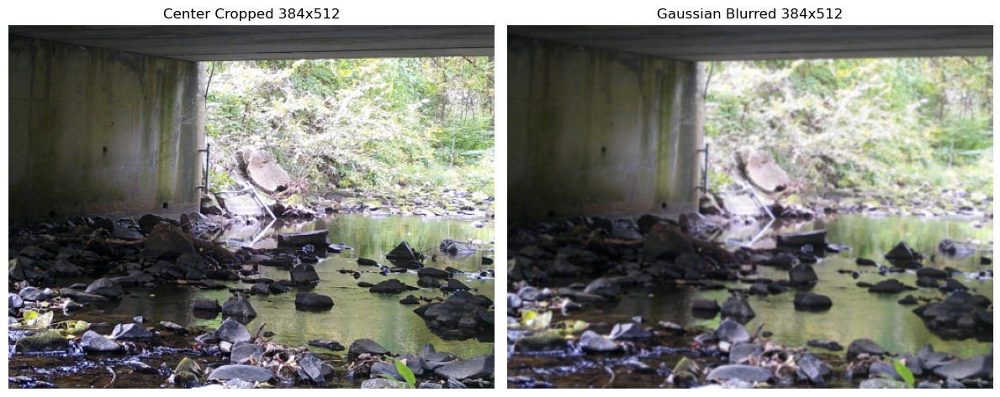

In [88]:
# gaussian blur
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# cropped image
ax1.imshow(center_cropped_image.permute(1, 2, 0))
ax1.set_title(f'Center Cropped {center_cropped_image.shape[1]}x{center_cropped_image.shape[2]}')
ax1.axis('off')

gaussian_blurred_image = GaussianBlur(kernel_size=5)(center_cropped_image)
ax2.imshow(gaussian_blurred_image.permute(1, 2, 0))
ax2.set_title(f'Gaussian Blurred {gaussian_blurred_image.shape[1]}x{gaussian_blurred_image.shape[2]}')
ax2.axis('off')

plt.tight_layout()
plt.show()